In [1]:
import os
import pandas as pd
import numpy as np
from scipy import signal
import matplotlib.pyplot as plt

# Split accelerometer data

In [2]:
df_acc = pd.read_csv('../data/raw/all_accelerometer_data_pids_13.csv', 
                        sep = ',',
                        dtype={'x': np.float32, 'y': np.float32, 'z': np.float32})

In [3]:
df_acc = df_acc.rename({'time': 'timestamp'}, axis='columns')
#df_acc['datetime'] = pd.to_datetime(df_acc['timestamp'], unit='ms')
df_acc = df_acc[df_acc.timestamp != 0]

In [4]:
df_acc.head(10)

,timestamp,pid,x,y,z
2,1493733882409,SA0297,0.0758,0.0273,-0.0102
3,1493733882455,SA0297,-0.0359,0.0794,0.0037
4,1493733882500,SA0297,-0.2427,-0.0861,-0.0163
5,1493733883945,SA0297,-0.2888,0.0514,-0.0145
6,1493733883953,SA0297,-0.0413,-0.0184,-0.0105
7,1493733883957,SA0297,-0.0413,-0.0001,0.0017
8,1493733883963,SA0297,-0.0286,-0.0028,-0.0094
9,1493733883974,SA0297,-0.0543,-0.0410,-0.0109
10,1493733883977,SA0297,0.0070,-0.0050,-0.0849
11,1493733883991,SA0297,-0.0561,-0.0226,0.0134


In [5]:
df_acc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14057565 entries, 2 to 14057566
Data columns (total 5 columns):
 #   Column     Dtype  
---  ------     -----  
 0   timestamp  int64  
 1   pid        object 
 2   x          float32
 3   y          float32
 4   z          float32
dtypes: float32(3), int64(1), object(1)
memory usage: 482.6+ MB


In [6]:
pids = df_acc['pid'].unique().tolist()
pids.sort()
pids

['BK7610',
 'BU4707',
 'CC6740',
 'DC6359',
 'DK3500',
 'HV0618',
 'JB3156',
 'JR8022',
 'MC7070',
 'MJ8002',
 'PC6771',
 'SA0297',
 'SF3079']

In [7]:
from pathlib import Path

def mkdir_secure(path):
    if not os.path.exists(path):
        os.makedirs(path)

In [8]:
acc_data_path = os.path.join('..', 'data', 'interim', 'acc_data')
mkdir_secure(acc_data_path)

In [9]:
grouped = df_acc.groupby(['pid'], group_keys=False)
print(grouped.groups)

{'BK7610': Int64Index([  47136,   47138,   47140,   47142,   47144,   47146,   47148,
              47150,   47152,   47154,
            ...
            6071084, 6071087, 6071092, 6071096, 6071100, 6071104, 6071108,
            6071112, 6071117, 6071121],
           dtype='int64', length=1225727), 'BU4707': Int64Index([ 214868,  214871,  214874,  214877,  214880,  214883,  214886,
             214889,  214892,  214895,
            ...
            4168144, 4168151, 4168159, 4168168, 4168176, 4168184, 4168192,
            4168201, 4168209, 4168217],
           dtype='int64', length=447423), 'CC6740': Int64Index([  726741,   726748,   726755,   726762,   726769,   726777,
              726784,   726790,   726797,   726806,
            ...
            14057557, 14057558, 14057559, 14057560, 14057561, 14057562,
            14057563, 14057564, 14057565, 14057566],
           dtype='int64', length=2374694), 'DC6359': Int64Index([  88314,   88317,   88320,   88323,   88326,   88329,   88332,
 

In [10]:
for k, gr in grouped:    
    gr = gr.drop(columns=['pid'])
    gr.to_csv(os.path.join(acc_data_path, f'{k}.csv'), index=False)
    print(f'Saved {k}')

Saved BK7610
Saved BU4707
Saved CC6740
Saved DC6359
Saved DK3500
Saved HV0618
Saved JB3156
Saved JR8022
Saved MC7070
Saved MJ8002
Saved PC6771
Saved SA0297
Saved SF3079


# Combine raw and cleaned tac data

In [11]:
def load_raw_tac(pid):
    tac_columns = ['TAC Level', 'IR Voltage', 'Temperature', 'Time', 'Date']
    df_tac = pd.read_excel(f'../data/raw/raw_tac/{pid} CAM Results.xlsx',
                       skiprows=1,
                       usecols=tac_columns,
                       dtype={tac_columns[0]: np.float32, tac_columns[1]: np.float32, tac_columns[2]: np.float32, })
    
    #df_tac['datetime'] = df_tac['Time'].astype('datetime64[ns]')
    
    # https://pandas.pydata.org/pandas-docs/stable/user_guide/timeseries.html#from-timestamps-to-epoch
    # use ms, since thats the accuracy of the accelerometer data
    df_tac['timestamp'] = (df_tac['Time'] - pd.Timestamp('1970-01-01', unit='ns')) // pd.Timedelta('1ms')
    
    df_tac = df_tac.drop(columns=['Time', 'Date'])
    df_tac = df_tac.rename({
        tac_columns[0]: 'tac_raw',
        tac_columns[1]: 'ir_voltage',
        tac_columns[2]: 'temperature'
    }, axis='columns')
    
    # convert temp from Farenheit to Celsius
    df_tac['temperature'] = (df_tac['temperature'] - 32) * 5.0/9.0
    
    return df_tac

In [12]:
raw_tacs = {}
for pid in pids:
    raw_tacs[pid] = load_raw_tac(pid)

In [13]:
raw_tacs[pids[0]].head(10)

,tac_raw,ir_voltage,temperature,timestamp
0,0.000,1.127,23.863890,1493721414000
1,0.000,1.121,23.863890,1493723397000
2,0.000,1.069,24.792778,1493723727000
3,0.000,1.060,25.206112,1493724057000
4,0.000,1.108,25.516111,1493724386000
5,0.000,1.049,25.722223,1493724716000
6,0.000,1.058,26.032223,1493725045000
7,0.000,1.101,26.342222,1493725374000
8,0.008,1.181,26.548889,1493725703000
9,0.000,1.026,23.243887,1493727532000


In [14]:
raw_tacs[pids[0]].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 57 entries, 0 to 56
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   tac_raw      57 non-null     float32
 1   ir_voltage   57 non-null     float32
 2   temperature  57 non-null     float32
 3   timestamp    57 non-null     int64  
dtypes: float32(3), int64(1)
memory usage: 1.2 KB


In [15]:
def load_clean_tac(pid):
    tac_c_columns = ['timestamp', 'TAC_Reading']
    df_tac_c = pd.read_csv(f'../data/raw/clean_tac/{pid}_clean_TAC.csv', 
                        sep = ',',
                        dtype={tac_c_columns[0]: np.int64, tac_c_columns[1]: np.float64})
    df_tac_c = df_tac_c.rename({tac_c_columns[1]: 'tac_clean'}, axis='columns')
    df_tac_c['timestamp'] = df_tac_c['timestamp'] * 1000
    #df_tac_c['datetime'] = pd.to_datetime(df_tac_c['timestamp'], unit='ms')
    return df_tac_c

In [16]:
clean_tacs = {}
for pid in pids:
    clean_tacs[pid] = load_clean_tac(pid)

In [17]:
clean_tacs[pids[0]].head(10)

,timestamp,tac_clean
0,1493718714000,-0.000482
1,1493720697000,0.001573
2,1493721027000,0.002144
3,1493721357000,0.000877
4,1493721686000,-0.001145
5,1493722016000,-0.002159
6,1493722345000,-0.001033
7,1493722674000,0.001808
8,1493723003000,0.004542
9,1493724832000,0.005185


In [18]:
clean_tacs[pids[0]].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 57 entries, 0 to 56
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   timestamp  57 non-null     int64  
 1   tac_clean  57 non-null     float64
dtypes: float64(1), int64(1)
memory usage: 1.0 KB


In [19]:
tac_data_path = os.path.join('..', 'data', 'interim', 'tac_data')
mkdir_secure(tac_data_path)

In [20]:
for pid in pids:
    on_column = 'timestamp'
    df = pd.merge(left=clean_tacs[pid], right=raw_tacs[pid], how='outer', left_on=on_column, right_on=on_column)
    df = df.sort_values(by=[on_column])
    df.to_csv(os.path.join(tac_data_path, f'{pid}.csv'), index=False)

# Merging and Interpolation
The dataset doesn't contain equally spaced data points, therefore we resample the timestamps and interpolate the missing data

In [21]:
full_data_cut_path = os.path.join('..', 'data', 'interim', 'full_data_resampled')
mkdir_secure(full_data_cut_path)

In [22]:
#!conda install -c conda-forge pyarrow -y

### CAUTION
Running the following method takes very long

BK7610
BU4707
CC6740
DC6359
DK3500
HV0618
JB3156
JR8022
MC7070
MJ8002
PC6771
SA0297
SF3079


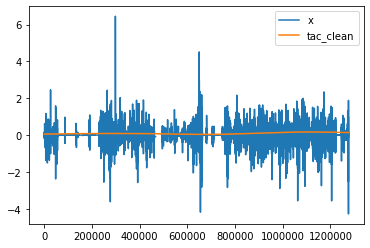

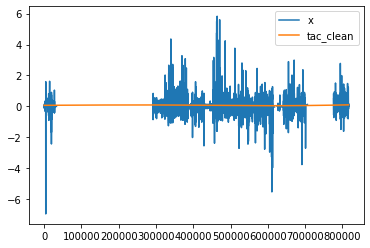

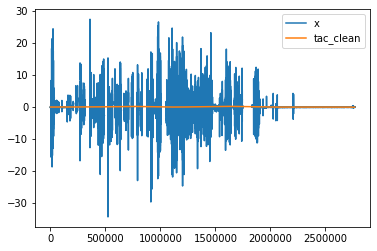

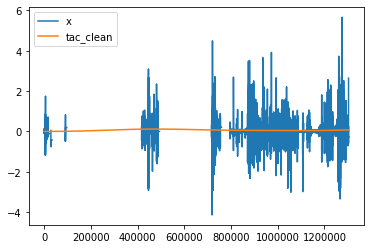

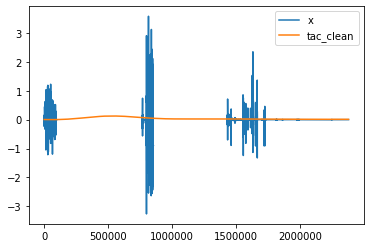

...

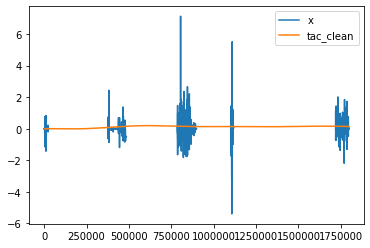

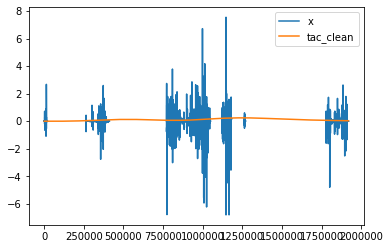

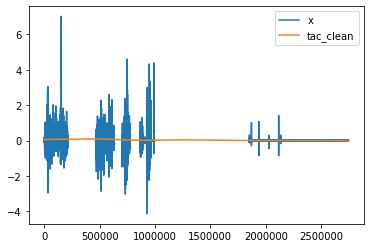

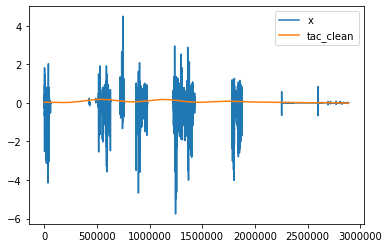

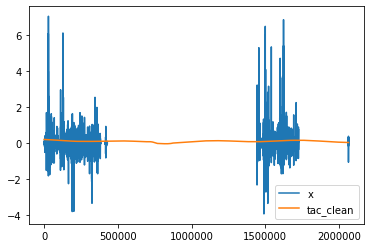

In [23]:
for pid in pids: #pids[:1]:

    on_column = 'timestamp'    

    df_acc_p = pd.read_csv(os.path.join(acc_data_path, f'{pid}.csv'), dtype={'x': np.float32, 'y': np.float32, 'z': np.float32})
    df_tac_p = pd.read_csv(os.path.join(tac_data_path, f'{pid}.csv'))

    # merging tac and acc
    df_outer = pd.merge(left=df_acc_p, right=df_tac_p, how='outer', left_on=on_column, right_on=on_column)

    df_outer['timestamp'] = pd.to_datetime(df_outer['timestamp'], unit='ms')
    df_outer = df_outer.set_index('timestamp')

    tac_c = list(df_tac_p.columns)
    tac_c.remove(on_column)
    acc_c = list(df_acc_p.columns)
    acc_c.remove(on_column)

    # https://pandas.pydata.org/pandas-docs/stable/user_guide/timeseries.html#dateoffset-objects    
    resampled = df_outer.resample('25ms').mean() # 40hz, `mean` doesnt mean anything as its upsampled
    df_up = resampled.interpolate(method='slinear', limit_direction='forward', axis='index', downcast='infer', limit_area='inside', limit=5000)

    df_up = df_up.reset_index()

    df_up[tac_c] = df_up[tac_c].interpolate(method='akima', limit_direction='both', axis='index', downcast='infer', limit_area='inside')

    # cropping to only have valid data
    first = max(df_up['x'].first_valid_index(), df_up['y'].first_valid_index(), df_up['z'].first_valid_index(), df_up['tac_clean'].first_valid_index())
    last = min(df_up['x'].last_valid_index(), df_up['y'].last_valid_index(), df_up['z'].last_valid_index(), df_up['tac_clean'].last_valid_index())
    df_cutted = df_up.iloc[first:last,:].reset_index(drop=True)
    
    print(pid)
    #df_cutted.to_csv(os.path.join(full_data_cut_path, f'{pid}.csv'), index=False)    
    df_cutted.to_feather(os.path.join(full_data_cut_path, f'{pid}.feather'))
    
    df_cutted[['x','tac_clean']].plot()

---

#### Old attempt

In [24]:
def create_epoch_ms_timeseries(start, end):
    freq = (1/40)*1000
    return pd.Series(np.arange(start, end, freq), dtype=np.int64, name='timestamp')

In [25]:
def interpolate(df, on_column):
    # set index to timestamp for proper interpolation
    df.index = df[on_column]
    df = df.drop(columns=[on_column])
    
    # interpolate missing values
    null_cols = df.isnull().sum()
    for key, value in null_cols.iteritems():
        if(value != 0):
            #print(f'{pid} interpolate {key}')
            df[key].interpolate(method='slinear', limit_direction='both', axis='index', inplace=True)       
    
    df.reset_index(level=0, inplace=True)
    return df

In [26]:
full_data_path = os.path.join('..', 'data', 'interim', 'full_data')
mkdir_secure(full_data_path)

In [27]:
merged_dfs = {}
for pid in pids:
    on_column = 'timestamp'    
    
    df_acc_p = pd.read_csv(os.path.join(acc_data_path, f'{pid}.csv'))
    df_tac_p = pd.read_csv(os.path.join(tac_data_path, f'{pid}.csv'))
    
#     df_acc_p = df_acc_p.dropna()
    
    # Interpolate acc data before merge and data trim on first and last datapoints
    ts_df = create_epoch_ms_timeseries(df_tac_p[on_column].min(), df_tac_p[on_column].max())
    df_tac_p = pd.merge(left=ts_df, right=df_tac_p, how='left', left_on=on_column, right_on=on_column)
    df_tac_p = interpolate(df_tac_p, on_column) 
    df = pd.merge(left=df_acc_p, right=df_tac_p, how='outer', left_on=on_column, right_on=on_column)
    first = df['x'].first_valid_index()
    last = df['x'].last_valid_index()
    df = df[first:last]
    df['z'].replace('', np.nan)
    df['tac_clean'].replace('', np.nan)
    df = df.dropna()
    df = interpolate(df, on_column)

    # Old (Complete) datasets in case:
    
#     df = pd.merge(left=df_acc_p, right=df_tac_p, how='outer', left_on=on_column, right_on=on_column)
#     df = interpolate(df, on_column)
    
    # first run, interpolate missing values
    
    # resample to achieve equally distanced datapoints
    #df = pd.merge(left=ts_df, right=df, how='left', left_on=on_column, right_on=on_column)    
    #second run for missing values
    #df = interpolate(df, on_column)
    
    
    df = df.sort_values(by=[on_column])
    merged_dfs[pid] = df
    print(pid)
    df.to_csv(os.path.join(full_data_path, f'{pid}.csv'), index=False)

BK7610
BU4707
CC6740
DC6359
DK3500
HV0618
JB3156
JR8022
MC7070
MJ8002
PC6771
SA0297
SF3079


# Remove Gaps in Acc_data

In [28]:
# df1 = pd.read_csv(f'{full_data_path}/BU4707.csv')
no_gaps_path = os.path.join('..','data','interim','no_gaps')
mkdir_secure(no_gaps_path)
for key,df1 in merged_dfs.items():
    df2 = df1.copy()
    df2['timestamp'] = pd.to_datetime(df2['timestamp'], unit='ms')
    gaps = np.array((df2['timestamp'].diff()).dt.seconds > 300)
    split_pts = np.where(gaps==True)[0].tolist()
    sp_pts = [0] + split_pts + [max(df2.index)]
    list_of_dfs = [df2.iloc[sp_pts[n]:sp_pts[n+1]] for n in range(len(sp_pts)-1)]
    i = 1
    for dd in list_of_dfs:
        filename = f'{key}_{i}.csv'
        if dd.shape[0] < 10:
            continue
        print(f'{filename}, {dd.shape}')
        dd.to_csv(os.path.join(no_gaps_path,filename),index=False)
        i += 1
        

BK7610_1.csv, (17798, 8)
BK7610_2.csv, (30540, 8)
BU4707_1.csv, (991, 8)
BU4707_2.csv, (12595, 8)
BU4707_3.csv, (2389, 8)
BU4707_4.csv, (1488, 8)
CC6740_1.csv, (7057, 8)
CC6740_2.csv, (500, 8)
CC6740_3.csv, (449, 8)
CC6740_4.csv, (340, 8)
CC6740_5.csv, (1142, 8)
CC6740_6.csv, (599, 8)
CC6740_7.csv, (1022, 8)
CC6740_8.csv, (1035, 8)
CC6740_9.csv, (52, 8)
CC6740_10.csv, (517, 8)
CC6740_11.csv, (206, 8)
CC6740_12.csv, (450, 8)
CC6740_13.csv, (4745, 8)
CC6740_14.csv, (14109, 8)
CC6740_15.csv, (1443, 8)
CC6740_16.csv, (33553, 8)
DC6359_1.csv, (618, 8)
DC6359_2.csv, (12, 8)
DC6359_3.csv, (13, 8)
DC6359_4.csv, (2553, 8)
DC6359_5.csv, (1408, 8)
DC6359_6.csv, (19098, 8)
DK3500_1.csv, (3592, 8)
DK3500_2.csv, (3219, 8)
DK3500_3.csv, (37474, 8)
HV0618_1.csv, (5527, 8)
HV0618_2.csv, (1190, 8)
HV0618_3.csv, (646, 8)
HV0618_4.csv, (754, 8)
HV0618_5.csv, (475, 8)
HV0618_6.csv, (46, 8)
HV0618_7.csv, (6645, 8)
HV0618_8.csv, (29506, 8)
JB3156_1.csv, (47328, 8)
JR8022_1.csv, (3753, 8)
JR8022_2.csv, (2118,

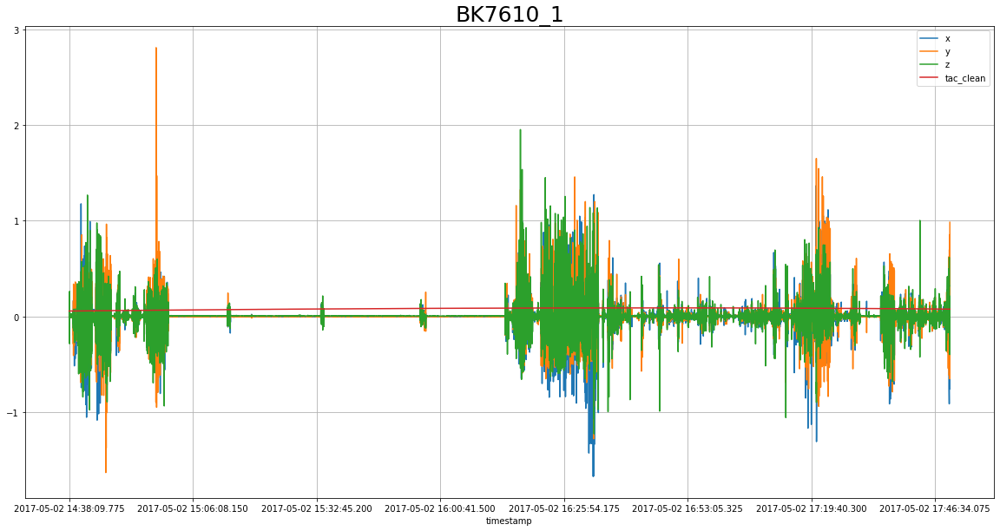

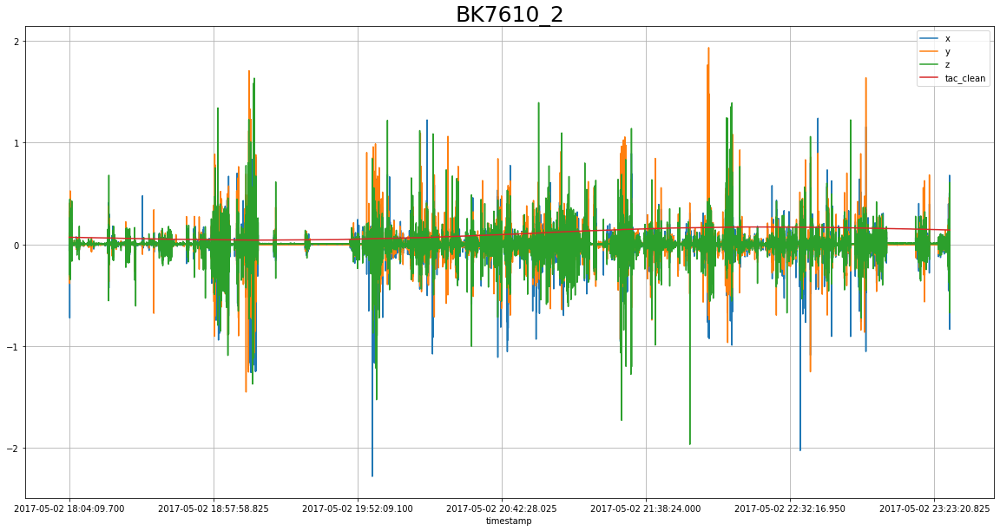

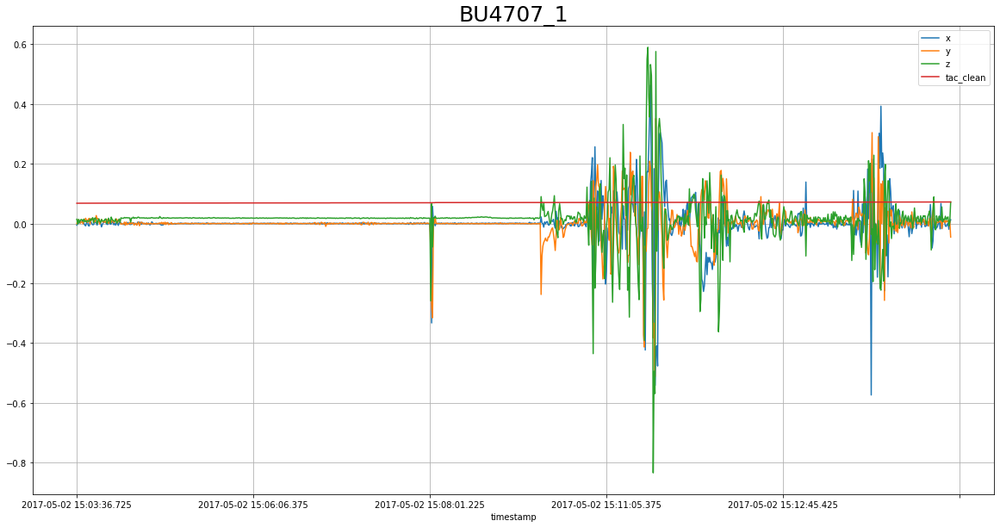

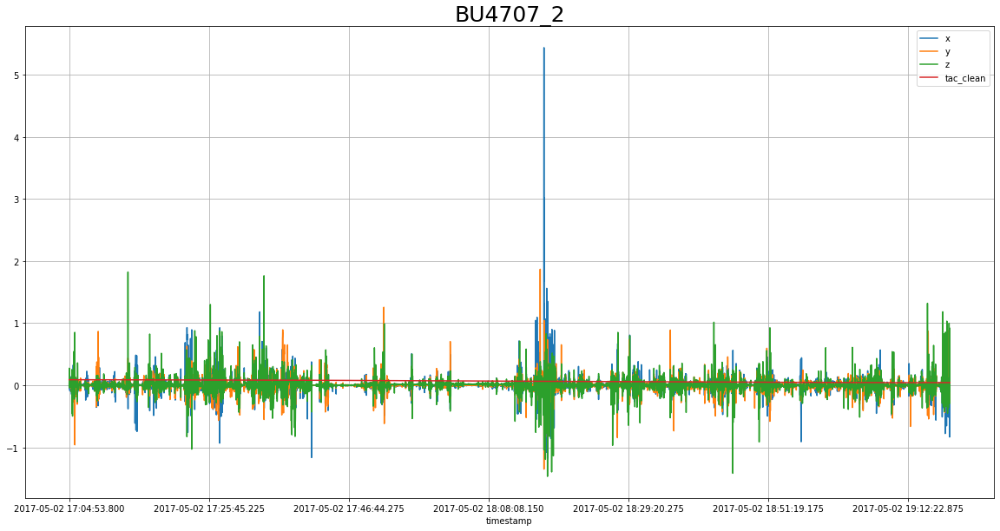

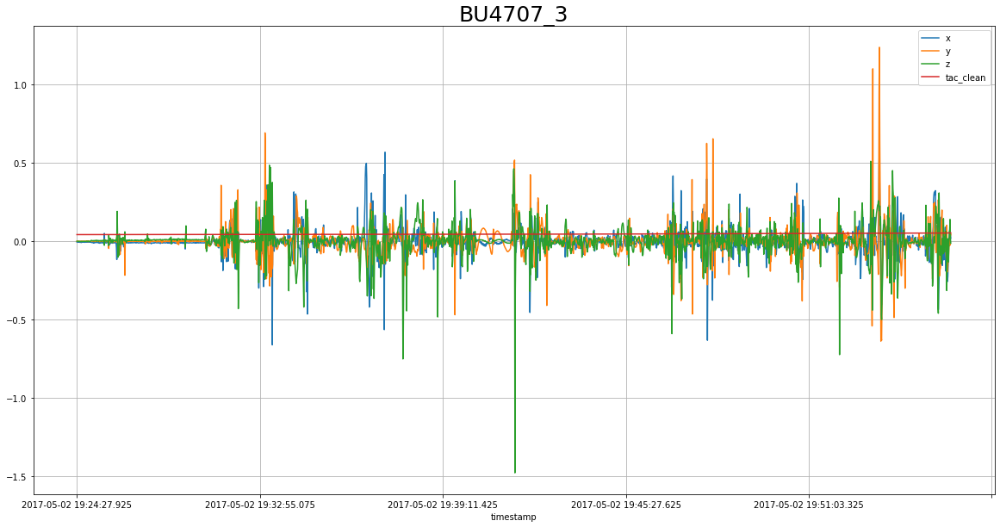

...

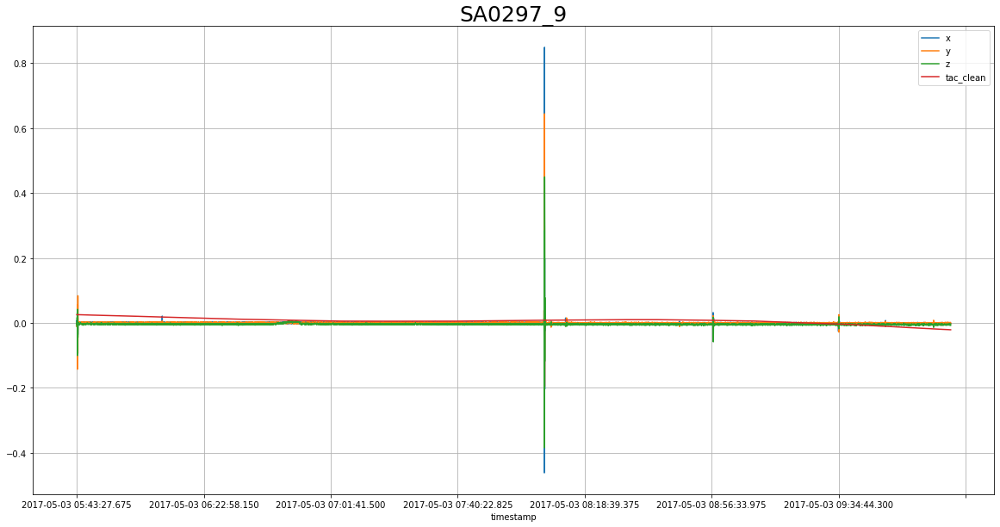

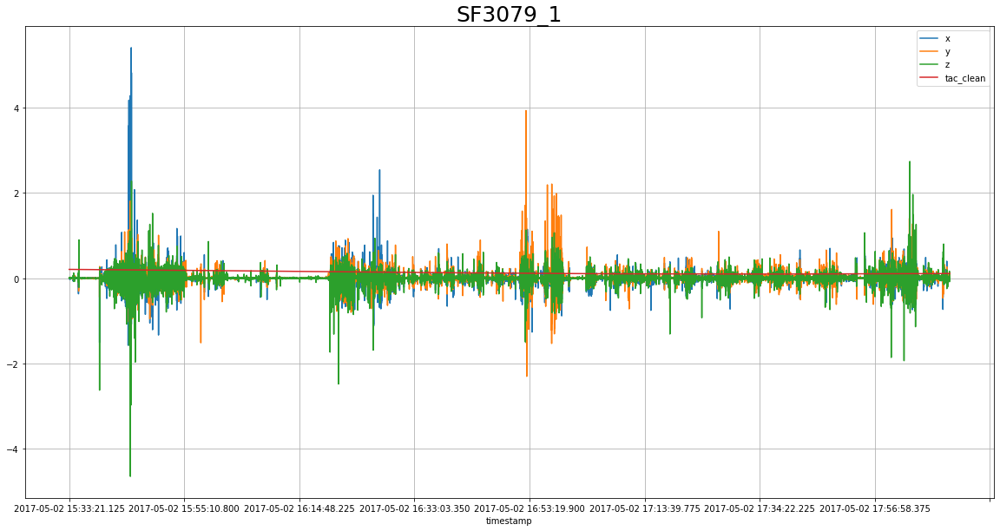

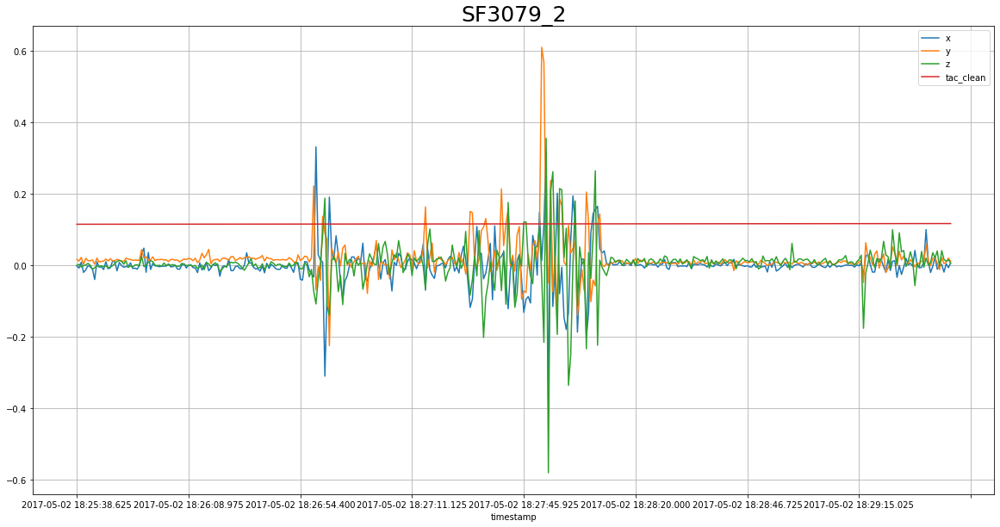

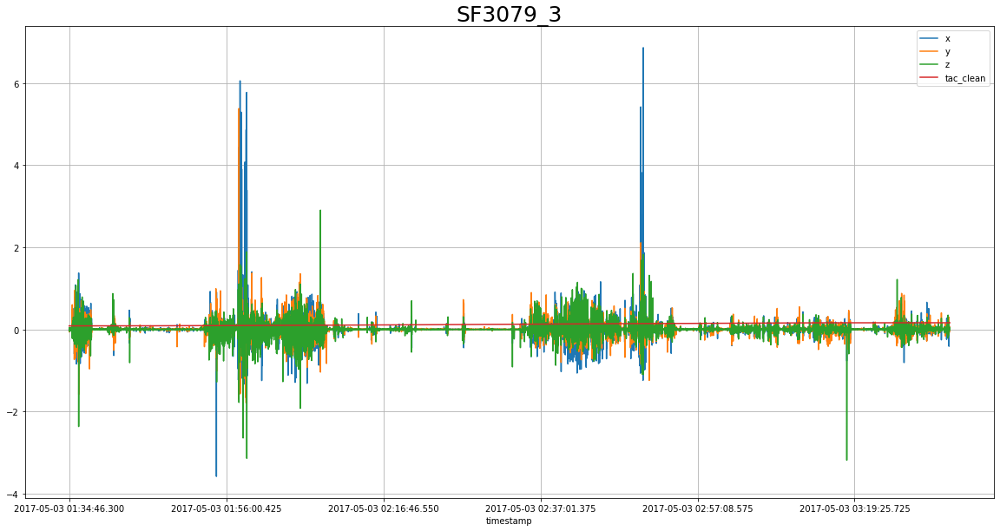

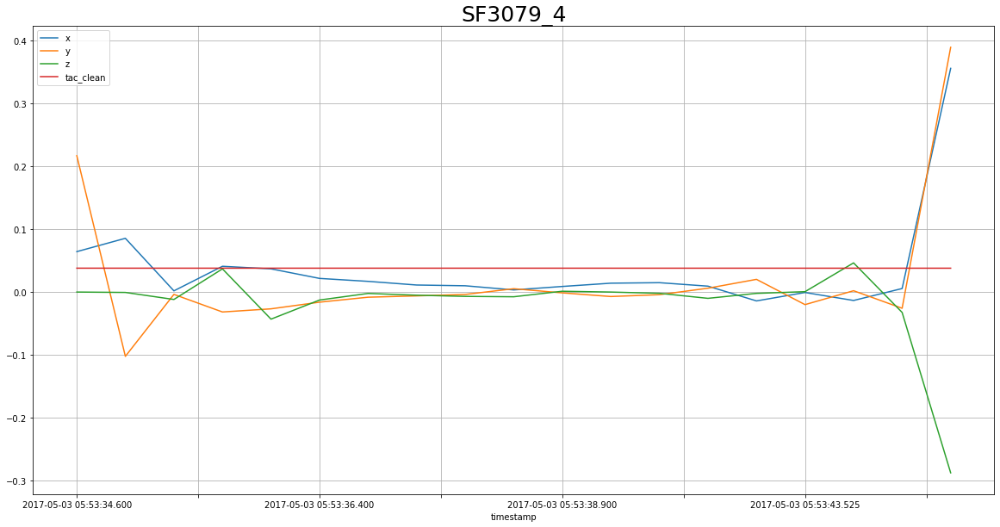

In [29]:
for file in os.listdir(no_gaps_path):
    dd = pd.read_csv(os.path.join(no_gaps_path,file))
    dd.plot(x='timestamp',y=['x','y','z','tac_clean'],figsize=(20,10),grid=True)
    
    plt.title(file.replace('.csv','') , size = 25)
    plt.show()


## Remove gaps in full cut data

In [33]:
no_gaps_path_resampled = os.path.join('..','data','interim','no_gaps_resampled')
mkdir_secure(no_gaps_path_resampled)

BK7610: 2 groups
BK7610_0.csv, (467082, 8)
BK7610_1.csv, (780887, 8)


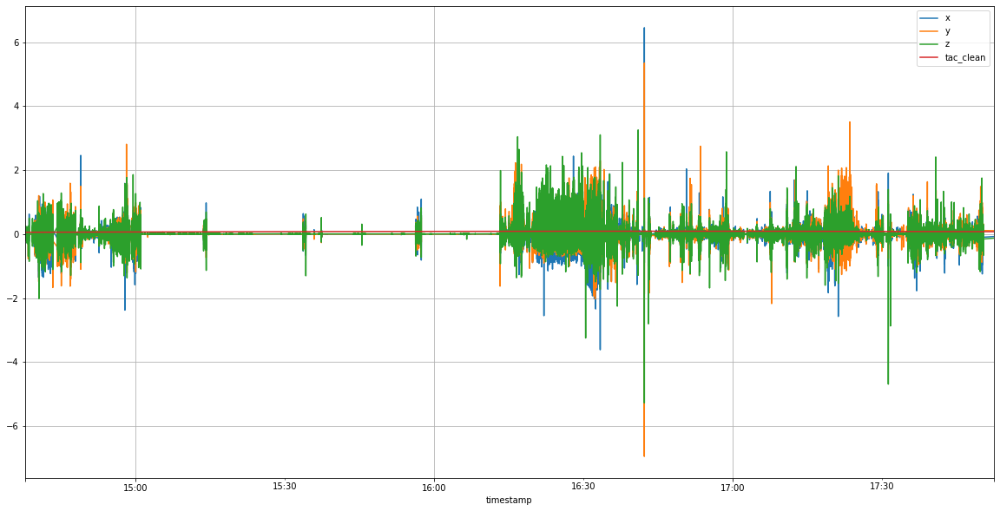

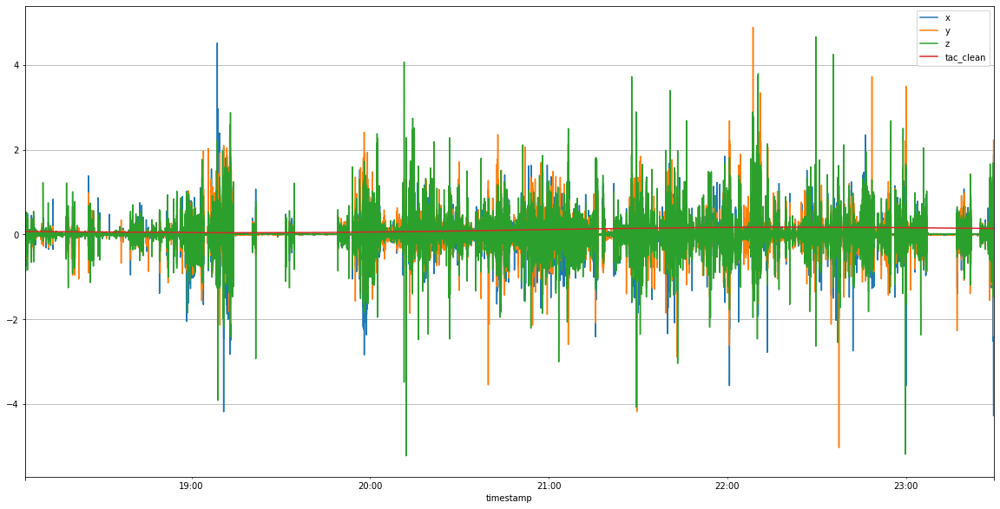

In [126]:
pid = pids[0]
df = pd.read_feather(os.path.join(full_data_cut_path, f'{pid}.feather'))

df.dropna(inplace=True)

m = df.index.to_series().diff().ne(1).cumsum() # find missing index

groups = df.groupby(m)

print(f'{pid}: {len(groups)} groups')

for i, (k, v) in enumerate(groups):
    #print(f'[group {k}]')
    #print(v)
    #print('\n')
    
    filename = f'{pid}_{i}.csv'
    print(f'{filename}, {v.shape}')
    #v.to_csv(os.path.join(no_gaps_path_resampled, filename),index=False)
    v.plot(x='timestamp',y=['x','y','z','tac_clean'],figsize=(20,10),grid=True)

---

In [130]:
for pid in pids:
    df = pd.read_feather(os.path.join(full_data_cut_path, f'{pid}.feather'))
    
    
    df.dropna(inplace=True)
    m = df.index.to_series().diff().ne(1).cumsum() # find missing index
    groups = df.groupby(m)
    
    #g = (df['x'].isna()).cumsum().where(~df['x'].isna())
    #groups = df.groupby(g)
    
    print(f'{pid}: {len(groups)} groups')

    for i, (k, v) in enumerate(groups):
        #print(f'[group {k}]')
        #print(v)

        filename = f'{pid}_{i}'
        print(f'{filename}, {v.shape}')
        #v.to_csv(os.path.join(no_gaps_path_resampled, f'{filename}.csv'),index=False)
        v.reset_index(drop=True, inplace=True)
        v.to_feather(os.path.join(no_gaps_path_resampled, f'{filename}.feather'))        

BK7610: 2 groups
BK7610_0, (467082, 8)
BK7610_1, (780887, 8)
BU4707: 5 groups
BU4707_0, (32963, 8)
BU4707_1, (326554, 8)
BU4707_2, (14014, 8)
BU4707_3, (64331, 8)
BU4707_4, (40031, 8)
CC6740: 19 groups
CC6740_0, (212597, 8)
CC6740_1, (21030, 8)
CC6740_2, (21379, 8)
CC6740_3, (15562, 8)
CC6740_4, (131757, 8)
CC6740_5, (47121, 8)
CC6740_6, (58476, 8)
CC6740_7, (32091, 8)
CC6740_8, (6896, 8)
CC6740_9, (17604, 8)
CC6740_10, (16708, 8)
CC6740_11, (16662, 8)
CC6740_12, (15426, 8)
CC6740_13, (109425, 8)
CC6740_14, (84816, 8)
CC6740_15, (365900, 8)
CC6740_16, (146972, 8)
CC6740_17, (80398, 8)
CC6740_18, (933691, 8)
DC6359: 6 groups
DC6359_0, (21667, 8)
DC6359_1, (5200, 8)
DC6359_2, (5291, 8)
DC6359_3, (76344, 8)
DC6359_4, (42774, 8)
DC6359_5, (508618, 8)
DK3500: 3 groups
DK3500_0, (98245, 8)
DK3500_1, (86329, 8)
DK3500_2, (948707, 8)
HV0618: 8 groups
HV0618_0, (153378, 8)
HV0618_1, (41121, 8)
HV0618_2, (21966, 8)
HV0618_3, (29081, 8)
HV0618_4, (18044, 8)
HV0618_5, (6002, 8)
HV0618_6, (172596, 

BK7610_0.feather
BK7610_1.feather
BU4707_0.feather
BU4707_1.feather
BU4707_2.feather
BU4707_3.feather
BU4707_4.feather
CC6740_0.feather
CC6740_1.feather
CC6740_10.feather
CC6740_11.feather
CC6740_12.feather
CC6740_13.feather
CC6740_14.feather
CC6740_15.feather
CC6740_16.feather
CC6740_17.feather
CC6740_18.feather
CC6740_2.feather
CC6740_3.feather
CC6740_4.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


CC6740_5.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


CC6740_6.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


CC6740_7.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


CC6740_8.feather
CC6740_9.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


DC6359_0.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


DC6359_1.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


DC6359_2.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


DC6359_3.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


DC6359_4.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


DC6359_5.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


DK3500_0.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


DK3500_1.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


DK3500_2.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


HV0618_0.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


HV0618_1.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


HV0618_2.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


HV0618_3.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


HV0618_4.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


HV0618_5.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


HV0618_6.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


HV0618_7.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


JB3156_0.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


JR8022_0.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


JR8022_1.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


JR8022_2.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


JR8022_3.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


JR8022_4.feather
MC7070_0.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MC7070_1.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MC7070_2.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MC7070_3.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MC7070_4.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MJ8002_0.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MJ8002_1.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MJ8002_2.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MJ8002_3.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MJ8002_4.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MJ8002_5.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


PC6771_0.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


PC6771_1.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


PC6771_2.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


PC6771_3.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


PC6771_4.feather
PC6771_5.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


PC6771_6.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


SA0297_0.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


SA0297_1.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


SA0297_10.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


SA0297_11.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


SA0297_12.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


SA0297_13.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


SA0297_2.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


SA0297_3.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


SA0297_4.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


SA0297_5.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


SA0297_6.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


SA0297_7.feather
SA0297_8.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


SA0297_9.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


SF3079_0.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


SF3079_1.feather
SF3079_2.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


SF3079_3.feather


B:\Anaconda3\envs\abv\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


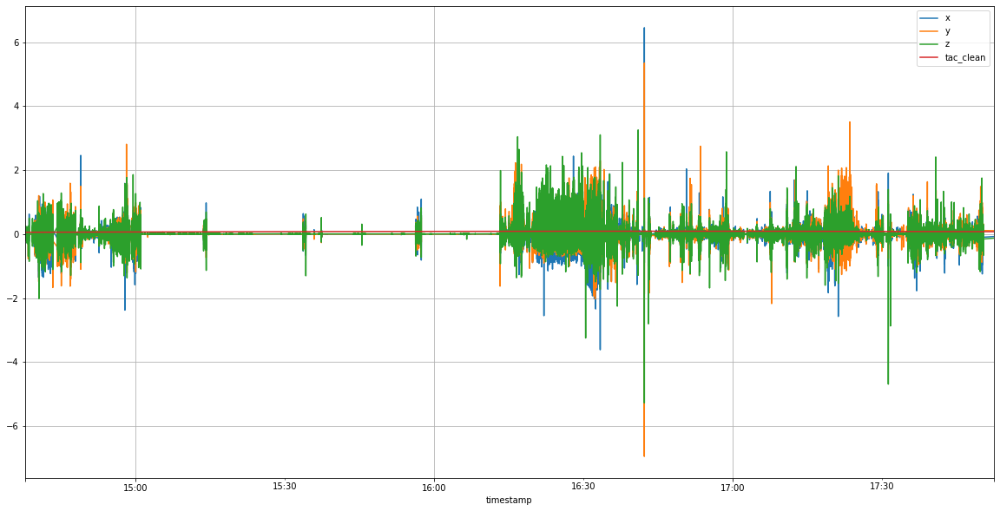

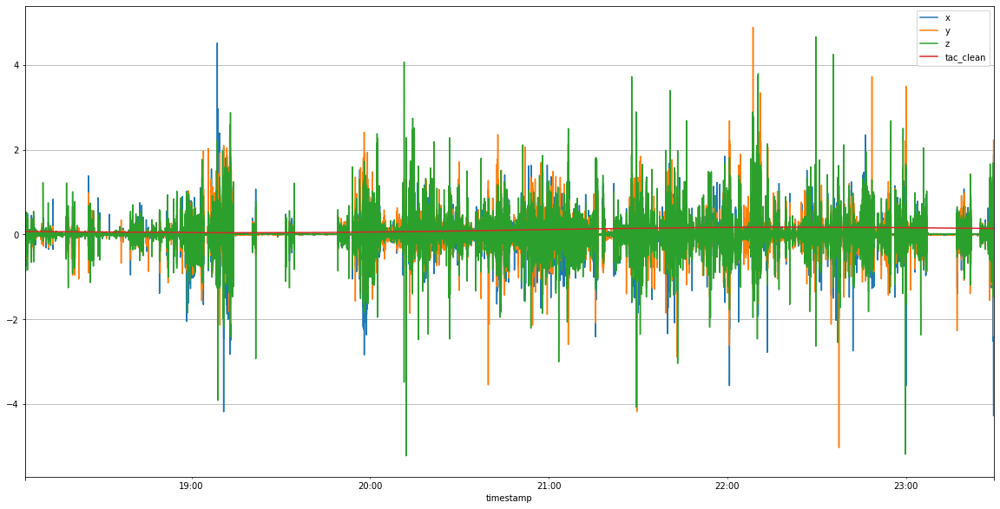

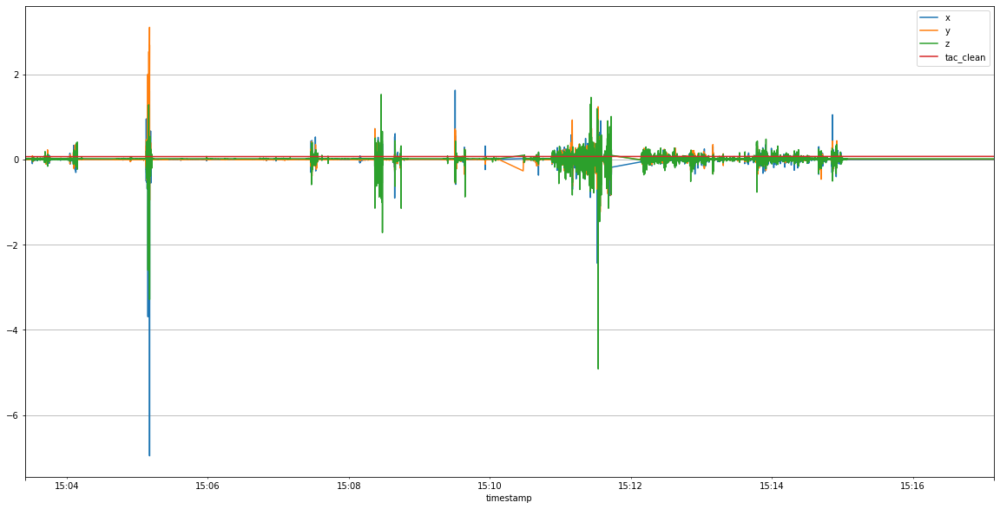

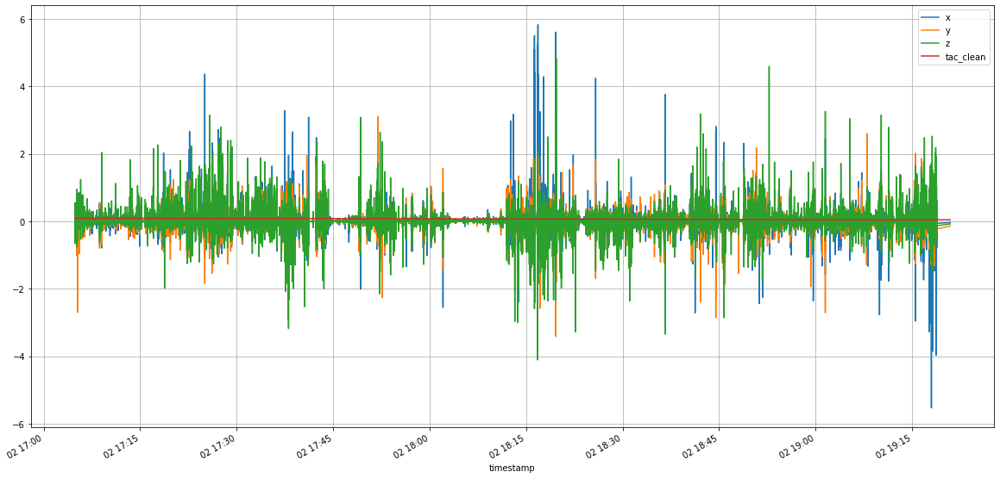

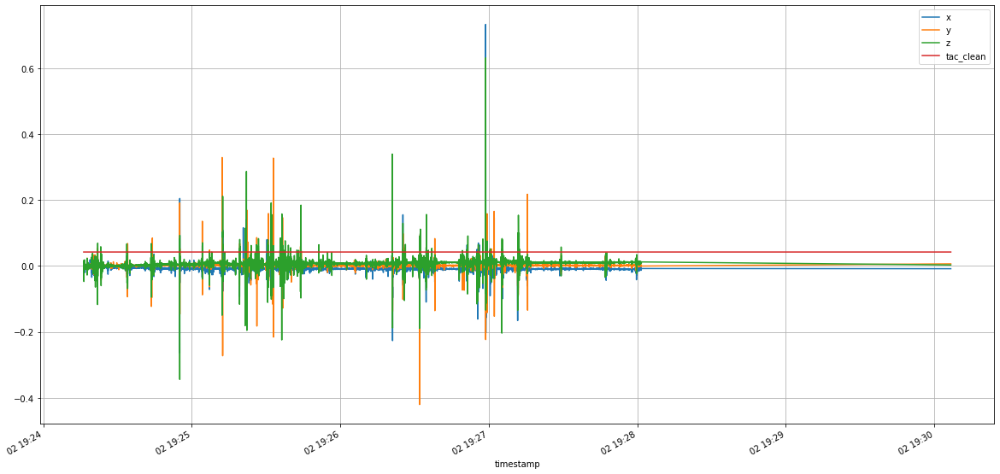

...

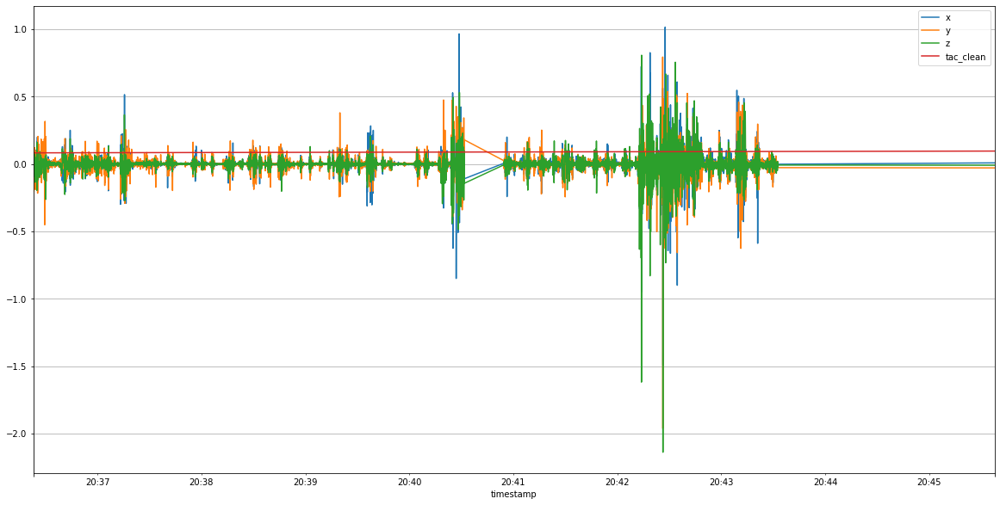

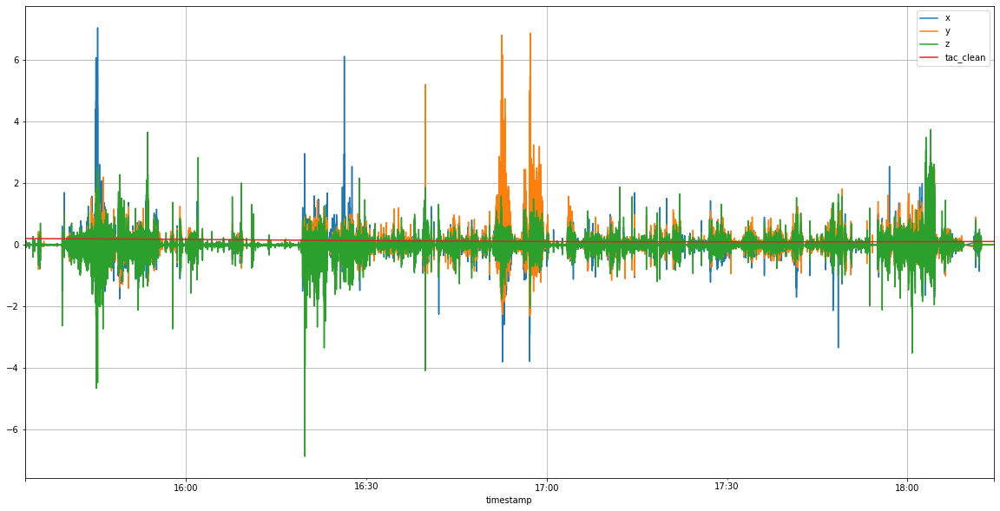

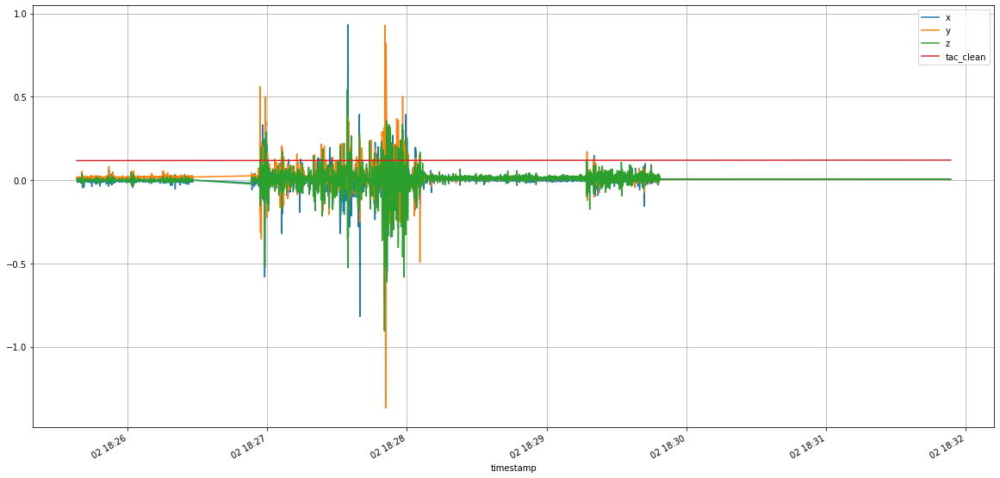

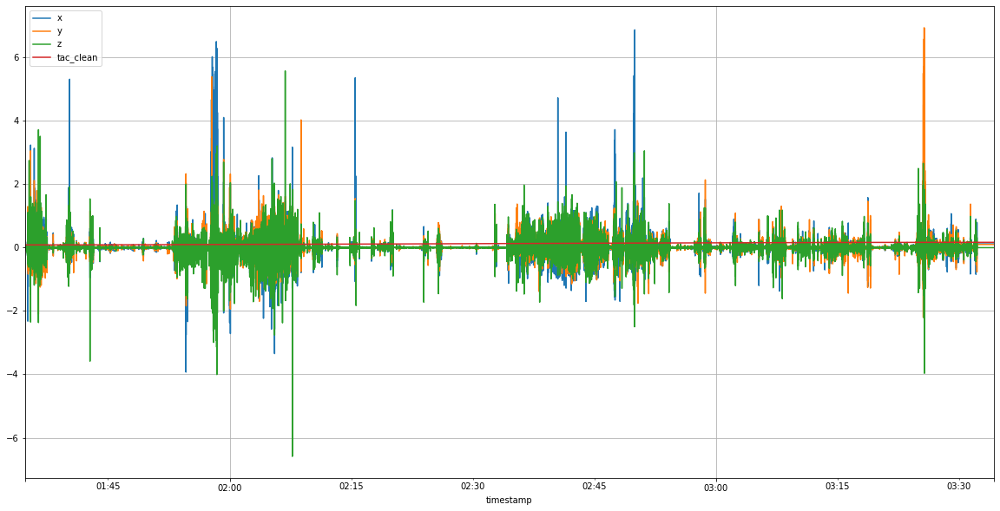

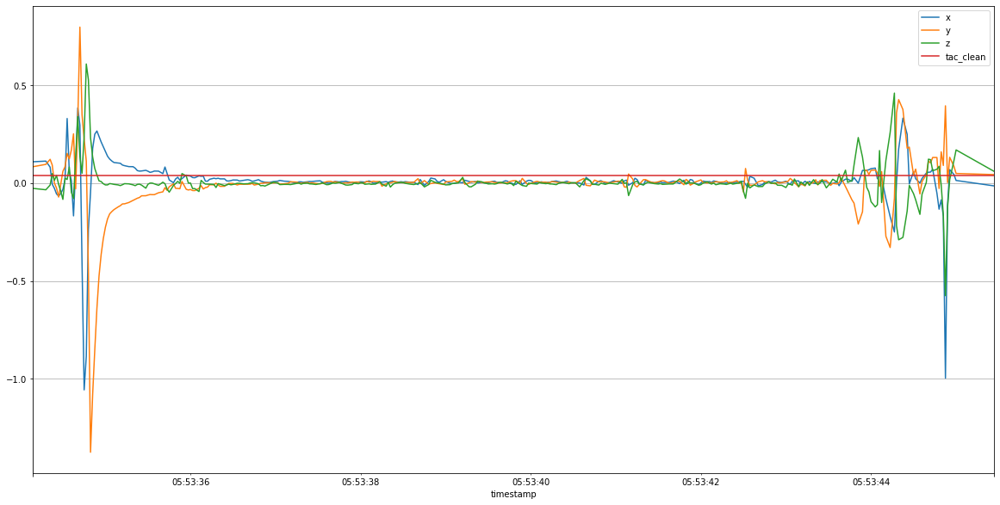

In [133]:
for file in os.listdir(no_gaps_path_resampled):
    print(file)
    df = pd.read_feather(os.path.join(no_gaps_path_resampled, file))
    df.plot(x='timestamp',y=['x','y','z','tac_clean'],figsize=(20,10),grid=True)